# Восстановление золота из руды

## Содержание: <a class="anchor" id="toc"></a>
* [Задача](#zero-bullet)
* [Описание проекта](#first-bullet)
* [Подготовка данных](#second-bullet)
    * [Изучение файлов](#f-bul)
    * [Предобработка данных](#s-bul)
    * [Проверка расчета эффективности обогащения](#t-bul)
    * [Признаки, недоступные в тестовой выборке](#fo-bul)
* [Анализ данных](#third-bullet)
    * [Изменение концентрации металлов на различных этапах очистки](#ff-bul)
    * [Сравнение распределений гранул на обучающей и тестовой выборках](#ss-bul)
    * [Суммарная концентрация металлов на различных этапах очистки](#tt-bul)
* [Модель](#fourth-bullet)
    * [Эффективность обогащения чернового концентрата](#fff-bul)
    * [Эффективность обогащения финального концентрата](#sss-bul)
    * [Проверка на тестовой выборке](#ttt-bul)
* [Вывод](#fifth-bullet)

## Задача <a class="anchor" id="zero-bullet"></a>

Необходимо подготовить прототип модели машинного обучения для «Цифры». Компания разрабатывает решения для эффективной работы промышленных предприятий. Модель должна предсказать коэффициент восстановления золота из золотосодержащей руды. В распоряжении есть данные с параметрами добычи и очистки. Модель поможет оптимизировать производство, чтобы не запускать предприятие с убыточными характеристиками.

## План

1. Подготовить данные:
    1. Открыть и изучить данные.
    2. Провести предобработку.
    3. Проверить, что эффективность обогащения рассчитана правильно. Вычислить её на обучающей выборке для признака `rougher.output.recovery`. Найти *MAE* между расчётами и значением признака. 
    4. Проанализировать признаки, недоступные в тестовой выборке. 

2. Провести исследовательский анализ данных:
    1. Посмотреть, как меняется концентрация металлов (Au, Ag, Pb) на различных этапах очистки. 
    2. Сравнить распределения размеров гранул сырья на обучающей и тестовой выборках. 
    3. Исследовать суммарную концентрацию всех веществ на разных стадиях.
    
3. Построить и обучить модель:
    1. Написать функцию для вычисления итоговой sMAPE.
    2. Обучить разные модели и оценить их качество кросс-валидацией. Выбрать лучшую модель и проверить её на тестовой выборке.

## Описание проекта <a class="anchor" id="first-bullet"></a>

Данные находятся в трёх файлах:

- `gold_recovery_train_new.csv` — обучающая выборка;
- `gold_recovery_test_new.csv` — тестовая выборка;
- `gold_recovery_full_new.csv` — исходные данные.

Данные индексируются датой и временем получения информации (признак `date`). Соседние по времени параметры часто похожи.

Некоторые параметры недоступны, потому что замеряются и/или рассчитываются значительно позже. Из-за этого в тестовой выборке отсутствуют некоторые признаки, которые могут быть в обучающей. Также в тестовом наборе нет целевых признаков.

Исходный датасет содержит обучающую и тестовую выборки со всеми признаками.

### Описание данных 

**Технологический процесс**

- *Rougher feed* — исходное сырье
- *Rougher additions* (или *reagent additions*) — флотационные реагенты: *Xanthate, Sulphate, Depressant*
    - *Xanthate* ***— ксантогенат (промотер, или активатор флотации);
    - *Sulphate* — сульфат (на данном производстве сульфид натрия);
    - *Depressant* — депрессант (силикат натрия).
- *Rougher process* (англ. «грубый процесс») — флотация
- *Rougher tails* — отвальные хвосты
- *Float banks* — флотационная установка
- *Cleaner process* — очистка
- *Rougher Au* — черновой концентрат золота
- *Final Au* — финальный концентрат золота

**Параметры этапов**

- *air amount* — объём воздуха
- *fluid levels* — уровень жидкости
- *feed size* — размер гранул сырья
- *feed rate —* скорость подачи

### Наименование признаков

Наименование признаков должно быть такое:

`[этап].[тип_параметра].[название_параметра]`

Возможные значения для блока `[этап]`:

- *rougher —* флотация
- *primary_cleaner* — первичная очистка
- *secondary_cleaner* — вторичная очистка
- *final* — финальные характеристики

Возможные значения для блока `[тип_параметра]`:

- *input* — параметры сырья
- *output* — параметры продукта
- *state* — параметры, характеризующие текущее состояние этапа
- *calculation —* расчётные характеристики

### Метрика качества

Для решения задачи используется метрика качества — **sMAPE** (англ. *Symmetric Mean Absolute Percentage Error*, «симметричное среднее абсолютное процентное отклонение»).

$$\text{sMAPE} = \frac{1}{N} \sum_{i = 1}^{N} \frac{|y_i - \hat{y}_i|}{(|y_i| + |\hat{y}_i|) / 2} * 100 \%$$

Нужно спрогнозировать сразу две величины:

1. эффективность обогащения чернового концентрата `rougher.output.recovery`;
2. эффективность обогащения финального концентрата `final.output.recovery`.

Итоговая метрика складывается из двух величин:

$$\text{sMAPE} = 25 \% * \text{sMAPE (rougher)} + 75 \% * \text{sMAPE (final)}$$

[Содержание](#toc)

## Подготовка данных <a class="anchor" id="second-bullet"></a>

### Изучение файлов <a class="anchor" id="f-bul"></a>

Откроем и изучим файлы. Сначала импортируем нужные билбиотеки и модули.

In [1]:
# basic packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# models
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.dummy import DummyRegressor

# preprocessing and scoring
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import mean_absolute_error, make_scorer
from pandas_profiling import ProfileReport

Откроем файлы и выведем первые строки каждого.

In [2]:
data_train = pd.read_csv('gold_recovery_train_new.csv')
data_test = pd.read_csv('gold_recovery_test_new.csv')
data_full = pd.read_csv('gold_recovery_full_new.csv')

In [3]:
data_train.head()

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2,2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
3,2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
4,2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691


In [4]:
data_test.head()

,date,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-09-01 00:59:59,210.800909,14.993118,8.080000,1.005021,1398.981301,-500.225577,1399.144926,-499.919735,1400.102998,...,12.023554,-497.795834,8.016656,-501.289139,7.946562,-432.317850,4.872511,-500.037437,26.705889,-499.709414
1,2016-09-01 01:59:59,215.392455,14.987471,8.080000,0.990469,1398.777912,-500.057435,1398.055362,-499.778182,1396.151033,...,12.058140,-498.695773,8.130979,-499.634209,7.958270,-525.839648,4.878850,-500.162375,25.019940,-499.819438
2,2016-09-01 02:59:59,215.259946,12.884934,7.786667,0.996043,1398.493666,-500.868360,1398.860436,-499.764529,1398.075709,...,11.962366,-498.767484,8.096893,-500.827423,8.071056,-500.801673,4.905125,-499.828510,24.994862,-500.622559
3,2016-09-01 03:59:59,215.336236,12.006805,7.640000,0.863514,1399.618111,-498.863574,1397.440120,-499.211024,1400.129303,...,12.033091,-498.350935,8.074946,-499.474407,7.897085,-500.868509,4.931400,-499.963623,24.948919,-498.709987
4,2016-09-01 04:59:59,199.099327,10.682530,7.530000,0.805575,1401.268123,-500.808305,1398.128818,-499.504543,1402.172226,...,12.025367,-500.786497,8.054678,-500.397500,8.107890,-509.526725,4.957674,-500.360026,25.003331,-500.856333


In [5]:
data_full.head()

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2,2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
3,2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
4,2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691


Выведем основную информацию о датасетах с помощью библиотеки `pandas_profiling`. 

In [6]:
report_train = ProfileReport(data_train, minimal=True)
report_train

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
report_test = ProfileReport(data_test, minimal=True)
report_test

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
report_full = ProfileReport(data_full, minimal=True)
report_full

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

[Содержание](#toc)

### Предобработка данных <a class="anchor" id="s-bul"></a>

Во всех наборах данных есть пропуски. Данные индексируются датой и временем получения информации (признак `date`). В условии указано, что cоседние по времени параметры часто похожи. Поэтому заполним пропуски методом forward fill.

In [9]:
data_train.fillna(method='ffill', inplace=True)
data_test.fillna(method='ffill', inplace=True)
data_full.fillna(method='ffill', inplace=True)

Проверим, что пропусков не осталось:

In [10]:
print(f'Пропусков в данных: {data_train.isna().sum().sum() + data_test.isna().sum().sum() + data_full.isna().sum().sum()}')

Пропусков в данных: 0


[Содержание](#toc)

### Проверка расчета эффективности обогащения <a class="anchor" id="t-bul"></a>

Проверим, что эффективность обогащения рассчитана правильно. Вычислим её на обучающей выборке для признака `rougher.output.recovery`, т.е. необходимо рассчитать эффективность обогащения в процессе флотации. Формула для вычисления эффективности обогащения (*R*):

$$R = \frac{C*(F-T)}{F*(C-T)} * 100\%,$$

*C* - доля золота в концентрате после флотации (колонка `rougher.output.concentrate_au`),  
*F* - доля золота в сырье до флотации (колонка `rougher.input.feed_au`),  
*T* - доля золота в отвальных хвостах после флотации (колонка `rougher.output.tail_au`).

Создадим переменную `rougher_manual_recovery`, которая будет указывать на результат расчета эффективности по формуле выше на основании данных из указанных колонок.

In [11]:
rougher_manual_recovery = ((data_train['rougher.output.concentrate_au'] * 
                           (data_train['rougher.input.feed_au'] - 
                            data_train['rougher.output.tail_au'])) / 
                           (data_train['rougher.input.feed_au'] * 
                            (data_train['rougher.output.concentrate_au'] - 
                            data_train['rougher.output.tail_au']))) * 100

Посчитаем ошибку MAE между этим расчетом и данными колонки `rougher.output.recovery`.

In [12]:
mean_absolute_error(rougher_manual_recovery, data_train['rougher.output.recovery'])

9.73512347450521e-15

**Вывод**: MAE между данными колонки `rougher.output.recovery` и сделанным самостоятельно расчетом пренебрежимо мала (в среднем различие наблюдается только в 15 знаке после запятой). Различие может быть обусловлено пропусками в данных. Если считать, что эффективность обогащения на остальных этапах посчитана с такой же точностью, значит, что в дальнейшем можно использовать данные столбцов c `.recovery` для анализа, избегая дополнительных расчетов.

[Содержание](#toc)

### Признаки, недоступные в тестовой выборке <a class="anchor" id="fo-bul"></a>

Проанализируем, какие признаки из обучающей выборки недоступны в тестовой.

In [13]:
features_not_in_test = ([col for col in list(data_train.columns) 
                         if col not in list(data_test.columns)])
features_not_in_test

['final.output.concentrate_ag',
 'final.output.concentrate_pb',
 'final.output.concentrate_sol',
 'final.output.concentrate_au',
 'final.output.recovery',
 'final.output.tail_ag',
 'final.output.tail_pb',
 'final.output.tail_sol',
 'final.output.tail_au',
 'primary_cleaner.output.concentrate_ag',
 'primary_cleaner.output.concentrate_pb',
 'primary_cleaner.output.concentrate_sol',
 'primary_cleaner.output.concentrate_au',
 'primary_cleaner.output.tail_ag',
 'primary_cleaner.output.tail_pb',
 'primary_cleaner.output.tail_sol',
 'primary_cleaner.output.tail_au',
 'rougher.calculation.sulfate_to_au_concentrate',
 'rougher.calculation.floatbank10_sulfate_to_au_feed',
 'rougher.calculation.floatbank11_sulfate_to_au_feed',
 'rougher.calculation.au_pb_ratio',
 'rougher.output.concentrate_ag',
 'rougher.output.concentrate_pb',
 'rougher.output.concentrate_sol',
 'rougher.output.concentrate_au',
 'rougher.output.recovery',
 'rougher.output.tail_ag',
 'rougher.output.tail_pb',
 'rougher.output.ta

Это: 
* доли веществ в концентрате и в отвальных хвостах:
    - в продукте флотации (колонки типа `rougher.output.concentrate` и `rougher.output.tail`);
    - в продукте первичной очистки (колонки типа `primary_cleaner.output.concentrate` и `primary_cleaner.output.tail`);
    - в финальном продукте (колонки типа `final.output.concentrate` и `final.output.tail`);

* доли веществ в отвальных хвостах в продукте вторичной очистки (колонки типа `secondary_cleaner.output.tail`);

* некоторые расчетные характеристики этапа флотации:
    - `rougher.calculation.sulfate_to_au_concentrate`;
    - `rougher.calculation.floatbank10_sulfate_to_au_feed`;
    - `rougher.calculation.floatbank11_sulfate_to_au_feed`;
    - `rougher.calculation.au_pb_ratio`;

* эффективности обогащения чернового концентрата и финального концентрата (это целевые переменные для наших моделей):
    - `rougher.output.recovery`;
    - `final.output.recovery`.
    
Переменные, отсутствующие в тестовой выборке, мы не можем брать в качестве признаков для обучения моделей. 

[Содержание](#toc)

## Анализ данных <a class="anchor" id="third-bullet"></a>

### Изменение концентрации металлов на различных этапах очистки <a class="anchor" id="ff-bul"></a>

Посмотрим, как меняется концентрация металлов (*Au*, *Ag*, *Pb*) на различных этапах очистки. Нам понадобятся колонки:

* `rougher.input.feed_au`, `rougher.input.feed_ag`, `rougher.input.feed_pb`
* `rougher.output.concentrate_au`, `rougher.output.concentrate_ag`, `rougher.output.concentrate_pb`
* `primary_cleaner.output.concentrate_au`, `primary_cleaner.output.concentrate_ag`, `primary_cleaner.output.concentrate_pb`
* `final.output.concentrate_au`, `final.output.concentrate_ag`, `final.output.concentrate_pb`

In [14]:
# датафрейм с начальными концентрациями
rougher_input_df = data_train[['rougher.input.feed_au', 
                         'rougher.input.feed_ag', 
                         'rougher.input.feed_pb']] \
                        .rename(columns={'rougher.input.feed_au': 'Au', 
                                         'rougher.input.feed_ag': 'Ag', 
                                         'rougher.input.feed_pb': 'Pb'})
rougher_feed_df_melted = pd.melt(rougher_input_df)

# датафрейм с концентрациями металлов после флотации
rougher_df = data_train[['rougher.output.concentrate_au', 
                         'rougher.output.concentrate_ag', 
                         'rougher.output.concentrate_pb']] \
                        .rename(columns={'rougher.output.concentrate_au': 'Au', 
                                         'rougher.output.concentrate_ag': 'Ag', 
                                         'rougher.output.concentrate_pb': 'Pb'})
rougher_df_melted = pd.melt(rougher_df)

# датафрейм с концентрациями металлов после первичной очистки
primary_cleaner_df = data_train[['primary_cleaner.output.concentrate_au', 
                                 'primary_cleaner.output.concentrate_ag', 
                                 'primary_cleaner.output.concentrate_pb']] \
                        .rename(columns={'primary_cleaner.output.concentrate_au': 'Au', 
                                         'primary_cleaner.output.concentrate_ag': 'Ag', 
                                         'primary_cleaner.output.concentrate_pb': 'Pb'})
primary_cleaner_df_melted = pd.melt(primary_cleaner_df)

# датафрейм с концентрациями металлов в финальном концентрате
final_df = data_train[['final.output.concentrate_au', 
                       'final.output.concentrate_ag', 
                       'final.output.concentrate_pb']] \
                    .rename(columns={'final.output.concentrate_au': 'Au', 
                                     'final.output.concentrate_ag': 'Ag', 
                                     'final.output.concentrate_pb': 'Pb'})
final_df_melted = pd.melt(final_df)

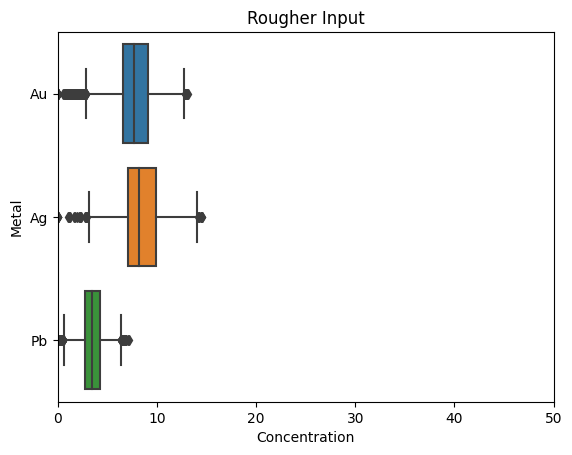

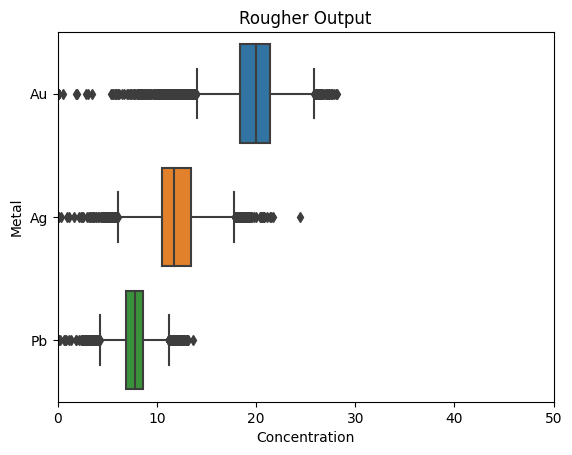

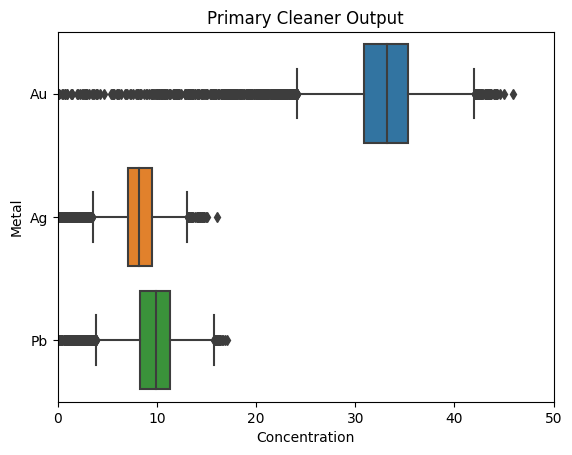

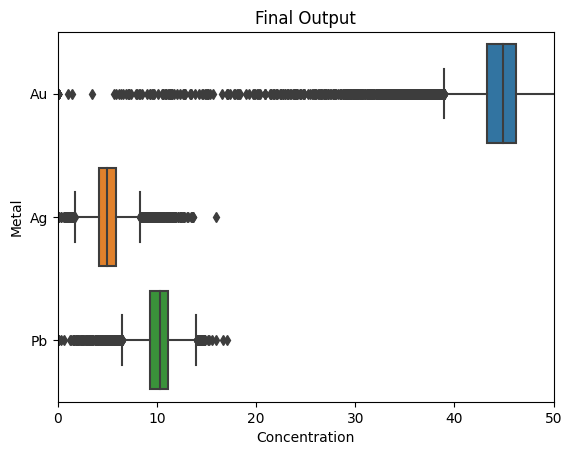

In [15]:
df_list = [rougher_feed_df_melted, rougher_df_melted, primary_cleaner_df_melted, 
           final_df_melted]
title_list = ['Rougher Input', 'Rougher Output', 'Primary Cleaner Output', 'Final Output']

for i, df in enumerate(df_list):
    sns.boxplot(y='variable', x='value', data=df)
    plt.xlim(0, 50)
    plt.xlabel('Concentration')
    plt.ylabel('Metal')
    plt.title(title_list[i])
    plt.show()

**Вывод**: Доля золота в концентрате на различных этапах очистки увеличилась с 10 % до практически 50 %. Доля серебра стабильно уменьшилась примерно до 5 %. Доля свинца после этапа первично очистки увеличилась приблизительно с до 10 %, и осталась на том же уровне в финальном продукте.

[Содержание](#toc)

### Сравнение распределений гранул на обучающей и тестовой выборках <a class="anchor" id="ss-bul"></a>

Сравним распределение размеров гранул сырья на обучающей и тестовой выборках.

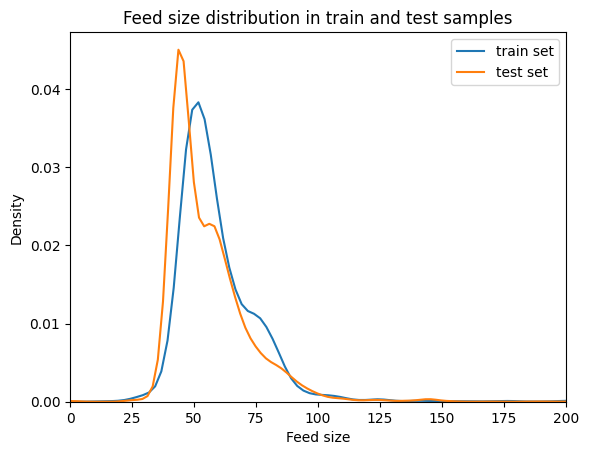

In [16]:
sns.kdeplot(x=data_train['rougher.input.feed_size'], label='train set')
sns.kdeplot(x=data_test['rougher.input.feed_size'], label='test set')
plt.legend()
plt.xlabel('Feed size')
plt.title('Feed size distribution in train and test samples')
plt.xlim(0, 200)
plt.show()

Распределения размеров гранул в обучающей и тестовой выборках достаточно похожи друг на друга, оба "растянуты" вправо.

[Содержание](#toc)

### Суммарная концентрация металлов на различных этапах очистки <a class="anchor" id="tt-bul"></a>

Исследуем суммарную концентрацию металлов на различных этапах очистки.

1. В сырье: колонки `rougher.input.feed_au`, `rougher.input.feed_ag`, `rougher.input.feed_pb`, `rougher.input.feed_sol`
2. В черновом концентрате: `rougher.output.concentrate_au`, `rougher.output.concentrate_ag`, `rougher.output.concentrate_pb`, `rougher.output.concentrate_sol`
3. После первичной очистки: `primary_cleaner.output.concentrate_au`, `primary_cleaner.output.concentrate_ag`, `primary_cleaner.output.concentrate_pb`, `primary_cleaner.output.concentrate_sol`
4. В финальном концентрате: `final.output.concentrate_au`, `final.output.concentrate_ag`, `final.output.concentrate_pb`, `final.output.concentrate_sol`

In [17]:
# датафрейм с суммарными концентрациями металлов на различных этапах
sum_concentrate = pd.DataFrame(data=data_train['date'])

sum_concentrate['Rougher Input'] = data_train[['rougher.input.feed_au', 
                                               'rougher.input.feed_ag', 
                                               'rougher.input.feed_pb', 
                                               'rougher.input.feed_sol']].sum(axis=1)
sum_concentrate['Rougher Output'] = data_train[['rougher.output.concentrate_au', 
                                                'rougher.output.concentrate_ag', 
                                                'rougher.output.concentrate_pb', 
                                                'rougher.output.concentrate_sol']].sum(axis=1)
sum_concentrate['Primary Cleaner Output'] = data_train[['primary_cleaner.output.concentrate_au', 
                                                        'primary_cleaner.output.concentrate_ag', 
                                                        'primary_cleaner.output.concentrate_pb', 
                                                        'primary_cleaner.output.concentrate_sol']].sum(axis=1)
sum_concentrate['Final Output'] = data_train[['final.output.concentrate_au', 
                                              'final.output.concentrate_ag', 
                                              'final.output.concentrate_pb', 
                                              'final.output.concentrate_sol']].sum(axis=1)

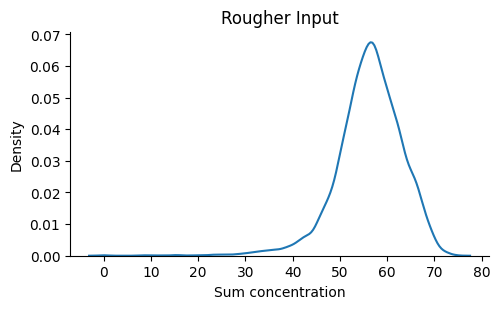

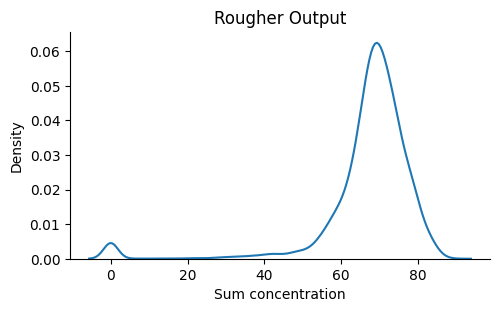

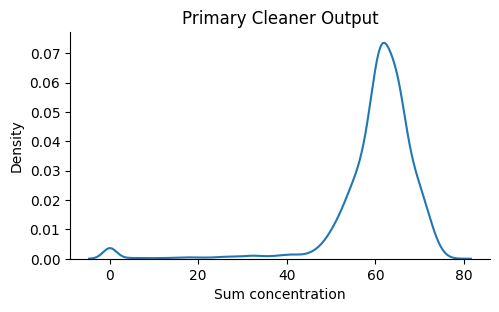

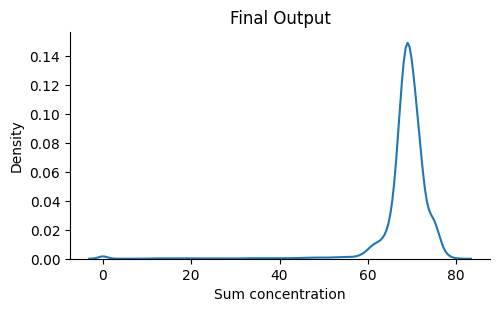

In [18]:
col_list = ['Rougher Input', 'Rougher Output', 'Primary Cleaner Output', 'Final Output']

for i, col in enumerate(col_list):
    sns.displot(x=col, data=sum_concentrate, kind='kde', height=3, aspect=1.7)
    plt.xlabel('Sum concentration')
    plt.ylabel('Density')
    plt.title(col)
    plt.show()

Видим, что с каждым этапом очистки распределение становится все уже, и суммарная концентрация металлов немного растет. На каждом этапе очистки есть некоторое количество нулевых и околонулевых значений суммарной концентрации веществ. Эти аномальные значения могут быть связаны со сбоями измерительного оборудования. Чтобы не обучать модели на эти аномалии, необходимо удалить их из обучающей выборки.

In [19]:
# оставляем строки с ненулевыми концентрациями (> 0)
data_train = data_train[data_train[['rougher.input.feed_au', 
                                    'rougher.input.feed_ag', 
                                    'rougher.input.feed_pb', 
                                    'rougher.input.feed_sol']].min(axis=1) > 0]

data_train = data_train[data_train[['rougher.output.concentrate_au', 
                                    'rougher.output.concentrate_ag', 
                                    'rougher.output.concentrate_pb', 
                                    'rougher.output.concentrate_sol']].min(axis=1) > 0]

data_train = data_train[data_train[['primary_cleaner.output.concentrate_au', 
                                    'primary_cleaner.output.concentrate_ag', 
                                    'primary_cleaner.output.concentrate_pb', 
                                    'primary_cleaner.output.concentrate_sol']].min(axis=1) > 0.1]

data_train = data_train[data_train[['final.output.concentrate_au', 
                                    'final.output.concentrate_ag', 
                                    'final.output.concentrate_pb', 
                                    'final.output.concentrate_sol']].min(axis=1) > 0]

Проверим, что аномалий не осталось.

In [20]:
# корректируем датафрейм для графиков
sum_concentrate = sum_concentrate.merge(data_train, on='date', how='right')[['date', 
                                                                             'Rougher Input',
                                                                             'Rougher Output', 
                                                                             'Primary Cleaner Output', 
                                                                             'Final Output']]

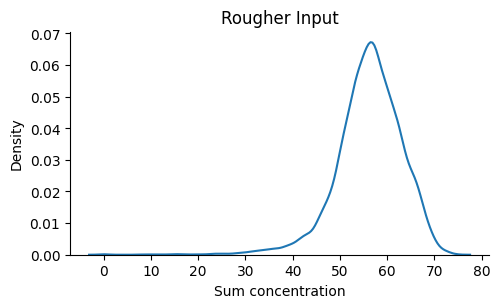

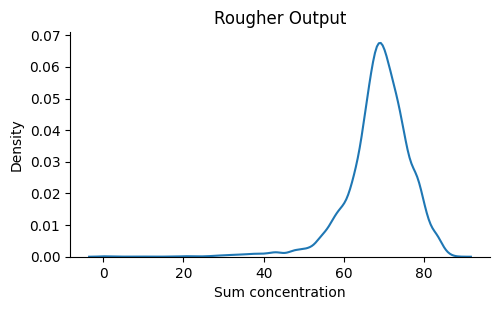

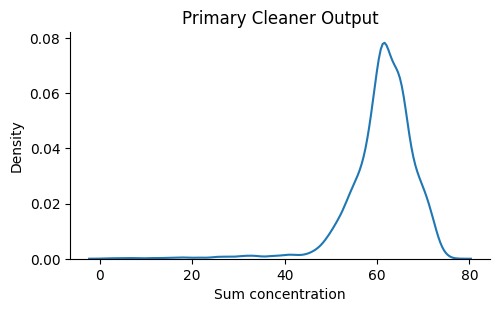

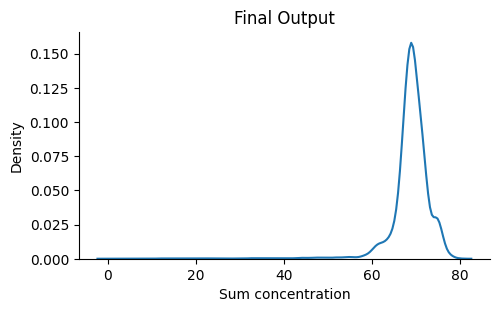

In [21]:
# рисуем новые графики, проверяем, что аномалий у нуля не осталось
for i, col in enumerate(col_list):
    sns.displot(x=col, data=sum_concentrate, kind='kde', height=3, aspect=1.7)
    plt.xlabel('Sum concentration')
    plt.title(col)
    plt.show()

[Содержание](#toc)

## Модель <a class="anchor" id="fourth-bullet"></a>

Напишем функцию ошибки sMAPE:

In [22]:
def smape(y_true, y_pred):
    smape = np.abs(y_true - y_pred) / ((np.abs(y_true) + np.abs(y_pred))/2) * 100
    smape = smape.fillna(value=0)
    smape = sum(smape) / len(smape)
    return smape

### Эффективность обогащения чернового концентрата <a class="anchor" id="fff-bul"></a>

Выделим признаки и таргет для первой модели, которая будет предсказывать эффективность обогащения чернового концентрата.

In [23]:
# Выделяем признаки и таргет для предсказания эффективности обогащения чернового концентрата 
# признаки с 'rougher'
col_list = []
for col in list(data_test.columns):
    if 'rougher' in col:
        col_list.append(col)
        
features_rougher = data_train[[col for col in col_list]]
target_rougher = data_train['rougher.output.recovery']

In [24]:
# масштабируем признаки
scaler_rougher = StandardScaler()
scaler_rougher.fit(features_rougher)
features_rougher = scaler_rougher.transform(features_rougher)

**Случайный лес**

Сравним разные модели случайного леса с помощью `RandomSearchCV`.

In [25]:
# сделаем кастомный скорер для сравнения моделей случайного леса с помощью RandomizedSearchCV
scorer = make_scorer(smape, greater_is_better=False)

In [26]:
# сравниваем модели случайного леса
rfr_model = RandomForestRegressor(random_state=12345)
params = {
    'n_estimators': range (100, 201, 20),
    'max_depth': range(5, 16, 1)
}
grid = RandomizedSearchCV(estimator=rfr_model, param_distributions=params, 
                          scoring=scorer, n_iter=15, cv=5, n_jobs = -1, 
                          verbose=1, random_state=12345)
grid.fit(features_rougher, target_rougher)

Fitting 5 folds for each of 15 candidates, totalling 75 fits


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=12345),
                   n_iter=15, n_jobs=-1,
                   param_distributions={'max_depth': range(5, 16),
                                        'n_estimators': range(100, 201, 20)},
                   random_state=12345,
                   scoring=make_scorer(smape, greater_is_better=False),
                   verbose=1)

In [27]:
# выводим параметры и скор лучшей модели случайного леса
print('Best Model', grid.best_params_)
print(f'Best Score: {np.abs(grid.best_score_):.2f}')

Best Model {'n_estimators': 180, 'max_depth': 5}
Best Score: 6.53


**Линейная регрессия**

In [28]:
# определим функцию для кросс-валидации модели линейной регрессии с помощью cross_val_score
def smape_scorer(model, X, y):
    y_pred = model.predict(X)
    smape_score = smape(y, y_pred)
    return smape_score

In [29]:
# проведем кросс-валидацию модели линейной регрессии
lr_model_1 = LinearRegression()
scores = cross_val_score(lr_model_1, features_rougher, 
                         target_rougher, cv=5, scoring=smape_scorer)
print(f'Score {scores.mean():.2f}')

Score 6.74


**Обучаем лучшую модель для этого этапа**

На этом этапе лучшей оказалась модель случайного леса с гиперпараметрами `n_estimators=180`, `max_depth=5`. Обучим ее.

In [30]:
rfr_model_1 = RandomForestRegressor(random_state=12345, n_estimators=180, max_depth=5)
rfr_model_1.fit(features_rougher, target_rougher)

RandomForestRegressor(max_depth=5, n_estimators=180, random_state=12345)

[Содержание](#toc)

### Эффективность обогащения финального концентрата <a class="anchor" id="sss-bul"></a>

In [31]:
# Выделяем признаки и таргет для предсказания эффективности обогащения финального концентрата 
features_final = data_train[[col for col in list(data_test.columns)]].drop('date', axis=1)
target_final = data_train['final.output.recovery']

In [32]:
# масштабируем признаки
scaler_final = StandardScaler()
scaler_final.fit(features_final)
features_final = scaler_final.transform(features_final)

**Случайный лес**

In [33]:
# сравниваем модели случайного леса
rfr_model = RandomForestRegressor(random_state=12345)
params = {
    'n_estimators': range (100, 201, 20),
    'max_depth': range(5, 16, 1)
}
grid = RandomizedSearchCV(estimator=rfr_model, param_distributions=params, 
                          scoring=scorer, n_iter=15, cv=5, n_jobs = -1, 
                          verbose=1, random_state=12345)
grid.fit(features_final, target_final)

Fitting 5 folds for each of 15 candidates, totalling 75 fits


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=12345),
                   n_iter=15, n_jobs=-1,
                   param_distributions={'max_depth': range(5, 16),
                                        'n_estimators': range(100, 201, 20)},
                   random_state=12345,
                   scoring=make_scorer(smape, greater_is_better=False),
                   verbose=1)

In [34]:
# выводим параметры и скор лучшей модели случайного леса
print('Best Model', grid.best_params_)
print(f'Best Score {np.abs(grid.best_score_):.2f}')

Best Model {'n_estimators': 180, 'max_depth': 5}
Best Score 9.06


**Линейная регрессия**

In [35]:
# проведем кросс-валидацию модели линейной регрессии
lr_model_2 = LinearRegression()
scores = cross_val_score(lr_model_2, features_final, target_final, 
                         cv=5, scoring=smape_scorer)
print(f'Score {scores.mean():.2f}')

Score 11.05


**Обучаем лучшую модель для этого этапа**

На этом этапе лучшей оказалась модель случайного леса с гиперпараметрами `n_estimators=180`, `max_depth=5`. Обучим ее.

In [36]:
rfr_model_2 = RandomForestRegressor(random_state=12345, n_estimators=180, max_depth=5)
rfr_model_2.fit(features_final, target_final)

RandomForestRegressor(max_depth=5, n_estimators=180, random_state=12345)

[Содержание](#toc)

### Проверка на тестовой выборке <a class="anchor" id="ttt-bul"></a>

Делаем предсказания моделями на тестовой выборке, считаем суммарное sMAPE.

In [37]:
# выделяем признаки из тестовой выборки для предсказания эффективности обогащения 
# чернового концентрата - признаки с 'rougher'
col_list = []
for col in list(data_test.columns):
    if 'rougher' in col:
        col_list.append(col)
        
features_test_rougher = data_test[[col for col in col_list]]

# масштабируем признаки из тестовой выборки
features_test_rougher = scaler_rougher.transform(features_test_rougher)

In [38]:
# выделяем признаки из тестовой выборки для предсказания эффективности обогащения 
# финального концентрата
features_test_final = data_test.drop('date', axis=1)

# масштабируем признаки из тестовой выборки
features_test_final = scaler_final.transform(features_test_final)

In [39]:
# делаем предсказания с выбранными лучшими моделями
pred_test_rougher = rfr_model_1.predict(features_test_rougher)
pred_test_final = rfr_model_2.predict(features_test_final)

In [40]:
# выделяем таргеты из датасета data_full
target_test_rougher = data_full.merge(data_test, on='date', how='right')['rougher.output.recovery']
target_test_final = data_full.merge(data_test, on='date', how='right')['final.output.recovery']

Посчитаем ошибку sMAPE для каждого этапа, и затем суммарную.

In [41]:
# ошибка для эффективности обогащения чернового концентрата
smape_rougher = smape(target_test_rougher, pred_test_rougher)

# ошибка для эффективности обогащения финального концентрата
smape_final = smape(target_test_final, pred_test_final)

# суммарная ошибка
smape_full = 0.25 * smape_rougher + 0.75 * smape_final
print(f'sMAPE на тестовой выборке: {smape_full:.2f}')

sMAPE на тестовой выборке: 9.38


Проведем сравнение с константной моделью. Обучим два DummyRegressor'a для каждого этапа и посчитаем суммарную sMAPE.

In [42]:
dummy_rougher = DummyRegressor(strategy="mean")
dummy_rougher.fit(features_rougher, target_rougher)
pred_dummy_rougher = dummy_rougher.predict(features_test_rougher)

dummy_final = DummyRegressor(strategy="mean")
dummy_final.fit(features_final, target_final)
pred_dummy_final = dummy_final.predict(features_test_final)

In [43]:
# ошибка для эффективности обогащения чернового концентрата
dummy_smape_rougher = smape(target_test_rougher, pred_dummy_rougher)

# ошибка для эффективности обогащения финального концентрата
dummy_smape_final = smape(target_test_final, pred_dummy_final)

# суммарная ошибка
smape_full = 0.25 * dummy_smape_rougher + 0.75 * dummy_smape_final
print(f'sMAPE DummyRegressor на тестовой выборке: {smape_full:.2f}')

sMAPE DummyRegressor на тестовой выборке: 9.83


[Содержание](#toc)

## Вывод <a class="anchor" id="fifth-bullet"></a>

1. На этапе предобработки были пропуски в данных были заполнены методом forward fill, поскольку в условии указана схожесть близких по дате данных. Было доказано, что эффективность обогащения чернового концентрата `rougher.output.recovery`, предоставленная в данных, рассчитана правильно.

2. Было проанализировано изменение доли металлов в концентрате на различных этапах очистки. Доля золота в концентрате на различных этапах очистки увеличилась с 10 % до практически 50 %. Доля серебра стабильно уменьшилась примерно до 5 %. Доля свинца после этапа первично очистки увеличилась приблизительно до 10 %, и осталась на том же уровне в финальном продукте.

3. Сравнение распределения размеров гранул сырья на обучающей и тестовой выборках показало, что эти распределения достаточно близки. Это значит, эти выборки можно совместно использовать для обучения модели (обучающую) и получения предсказаний (на тестовой).

4. Исследование суммарной концентрации металлов на различных этапах очистки показало, что есть аномальные данные с нулевыми или околонулевыми суммарными концентрациями. Эти аномальные данные были удалены из обучающей выборки.

5. Для определения лучшей модели была проведена кросс-валидация моделей случайного леса с различными значениями гиперпараметров и модели линейной регрессии с минимизацией кастомной ошибки `sMAPE`.
    В результате кросс-валидации для каждого этапа оценки были выбраны лучшие модели: 
    * на этапе оценки эффективности обогащения чернового концентрата (rougher) - модель случайного леса с гиперпараметрами `n_estimators=180`, `max_depth=5` со значением ошибки `sMAPE_rougher = 6.53`;
    * на этапе оценки эффективности обогащения финального концентрата (final) - модель случайного леса с гиперпараметрами `n_estimators=180`, `max_depth=5` со значением ошибки `sMAPE_final = 9.06`

6. Проверка моделей на тестовой выборке дала суммарную ошибку `sMAPE = 9.38`. Проверка константной модели на тестовой выборке дала ошибку `sMAPE = 9.83`. 

[Содержание](#toc)